In [110]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly as ly
import seaborn as sns

In [111]:
#Leitura de "spotify_artists.csv" para um data frame e tratamento dos dados exclusivamente para análise exploratória
df_artists = pd.read_csv('spotify_artists.csv', index_col=0)

#Remoção de colunas com informações irrelevantes ou redundantes
df_artists.drop(columns=["type"], inplace=True)

#Renomeação de colunas para melhor entendimento e cruzameto de informação com os demais .csv
df_artists.rename(columns={"name": "Nome do artista", 
                          "id": "ID do artista",
                          "artist_popularity": "Popularidade do artista",
                          "followers": "Seguidores",
                          "genres": "Gêneros",
                          "track_id": "ID da faixa",
                          "track_name_prev": "track_name_prev (artists)"}, inplace=True)

#Criação de coluna "Número de gêneros" e caracterização de artistas sem gêneros definidos como outliers, já que há perda de rótulo para a análise.
df_artists["Gêneros"] = df_artists["Gêneros"].apply(lambda x: x[1:-1].replace("\'", "").split(", "))
df_artists["Número de gêneros"] = df_artists["Gêneros"].apply(lambda x: len(x) if x != [""] else 0)

#Mudança na ordem das colunas para melhor visualização.
df_artists = df_artists[["Nome do artista",
                         "Popularidade do artista",
                         "Seguidores",
                         "Gêneros",
                         "Número de gêneros",
                         "track_name_prev (artists)",
                         "ID do artista",
                         "ID da faixa"]]

#Checagem de duplicatas a partir de características exclusivas aos artistas.
df_artists.drop_duplicates(["Nome do artista", "ID do artista"], inplace=True)
df_artists["Nome do artista"].value_counts()
df_artists["ID da faixa"].value_counts()

#Mudança de dtype para otimização
df_artists["ID do artista"] = df_artists["ID do artista"].astype("category")
df_artists["ID da faixa"] = df_artists["ID da faixa"].astype("category")


df_artists.info()
df_artists.head()

<class 'pandas.core.frame.DataFrame'>
Index: 56129 entries, 0 to 56128
Data columns (total 8 columns):
 #   Column                     Non-Null Count  Dtype   
---  ------                     --------------  -----   
 0   Nome do artista            56128 non-null  object  
 1   Popularidade do artista    56129 non-null  int64   
 2   Seguidores                 56129 non-null  int64   
 3   Gêneros                    56129 non-null  object  
 4   Número de gêneros          56129 non-null  int64   
 5   track_name_prev (artists)  56129 non-null  object  
 6   ID do artista              56129 non-null  category
 7   ID da faixa                56129 non-null  category
dtypes: category(2), int64(3), object(3)
memory usage: 7.2+ MB


,Nome do artista,Popularidade do artista,Seguidores,Gêneros,Número de gêneros,track_name_prev (artists),ID do artista,ID da faixa
0,Juliano Cezar,44,23230,"[sertanejo, sertanejo pop, sertanejo tradicion...",4,track_9,4mGnpjhqgx4RUdsIJiURdo,0wmDmAILuW9e2aRttkl4aC
1,The Grenadines,22,313,[],0,track_30,1dLnVku4VQUOLswwDFvRc9,4wqwj0gA8qPZKLl5WVqXml
2,Gangway,26,1596,[danish pop rock],1,track_38,6YVY310fjfUzKi8hiqR7iK,1bFqWDbvHmZe2f4Nf9qaD8
3,FADES,31,149,[uk alternative pop],1,track_34,2VElyouiCfoYPDJluzwJwK,3MFSUBAidPzRBbIS7BDj1S
4,Jean-Pierre Guignon,21,11,[french baroque],1,track_26,4agVy03qW8juSysCTUOuDI,2r3q57FhxdsCyYr0kuDq4b


In [112]:
#Leitura de "spotify_albums.csv" para um data frame e tratamento dos dados exclusivamente para análise exploratória.
df_albums = pd.read_csv('spotify_albums.csv', index_col=0)

#Remoção de colunas com informações irrelevantes, redundantes ou que seriam interessantes apenas com web scrapping.
df_albums.drop(columns=["type", "images", "release_date_precision", "external_urls"], inplace=True)

#Renomeação de colunas para melhor entendimento e cruzameto de informação com os demais .csv.
df_albums.rename(columns={"album_type": "Tipo do álbum", 
                          "available_markets": "Mercados disponíveis (albums)", 
                          "name": "Nome do álbum", 
                          "release_date": "Data de lançamento", 
                          "total_tracks": "Número de faixas", 
                          "artist_id": "ID do artista",
                          "id": "ID do álbum",
                          "track_id": "ID da faixa",
                          "href": "href (albums)",
                          "uri": "uri (albums)",
                          "track_name_prev": "track_name_prev (albums)"}, inplace=True)

#Criação de coluna "Número de mercados disponíveis".
df_albums["Mercados disponíveis (albums)"] = df_albums["Mercados disponíveis (albums)"].apply(lambda x: x[1:-1].replace("\'", "").split(", "))
df_albums["Número de mercados disponíveis (albums)"] = df_albums["Mercados disponíveis (albums)"].apply(lambda x: len(x) if x != [""] else 0)


#Mudança na ordem das colunas para melhor visualização.
df_albums = df_albums[["Nome do álbum", 
                       "Tipo do álbum", 
                       "Data de lançamento", 
                       "Número de faixas", 
                       "Mercados disponíveis (albums)",
                       "Número de mercados disponíveis (albums)",
                       "href (albums)",
                       "uri (albums)",
                       "track_name_prev (albums)",
                       "ID do álbum",
                       "ID do artista",
                       "ID da faixa"]]

#Checagem de duplicatas a partir de características exclusivas aos álbuns.
df_albums.drop_duplicates(["ID do álbum", "Nome do álbum"], inplace=True)
df_albums["Nome do álbum"].value_counts()
df_albums["ID do artista"].value_counts()
df_albums["ID da faixa"].value_counts()
#No data frame de álbuns, há muitos álbuns com nomes genéricos, com destaque para "Spotify Singles", "Greatets Hits" e Spotify Sessions".
#Logo, a checagem de duplicatas será feita somente a partir do ID dos álbuns.
#Muitos álbuns e músicas são "Various Artists Songs", estando sob um mesmo ID de artista. Por outro lado, as músicas têm IDs únicos.

#Mudança de dtype para otimização
df_albums["ID do álbum"] = df_albums["ID do álbum"].astype("category")
df_albums["ID do artista"] = df_albums["ID do artista"].astype("category")
df_albums["ID da faixa"] = df_albums["ID da faixa"].astype("category")


df_albums.info()
df_albums.head()

<class 'pandas.core.frame.DataFrame'>
Index: 75511 entries, 0 to 75510
Data columns (total 12 columns):
 #   Column                                   Non-Null Count  Dtype   
---  ------                                   --------------  -----   
 0   Nome do álbum                            75511 non-null  object  
 1   Tipo do álbum                            75511 non-null  object  
 2   Data de lançamento                       75511 non-null  object  
 3   Número de faixas                         75511 non-null  int64   
 4   Mercados disponíveis (albums)            75511 non-null  object  
 5   Número de mercados disponíveis (albums)  75511 non-null  int64   
 6   href (albums)                            75511 non-null  object  
 7   uri (albums)                             75511 non-null  object  
 8   track_name_prev (albums)                 75511 non-null  object  
 9   ID do álbum                              75511 non-null  category
 10  ID do artista                          

,Nome do álbum,Tipo do álbum,Data de lançamento,Número de faixas,Mercados disponíveis (albums),Número de mercados disponíveis (albums),href (albums),uri (albums),track_name_prev (albums),ID do álbum,ID do artista,ID da faixa
0,If I Ain't Got You EP,single,2019-02-08,6,"[AD, AE, AR, AT, AU, BE, BG, BH, BO, BR, CA, C...",79,https://api.spotify.com/v1/albums/1gAM7M4rBwEb...,spotify:album:1gAM7M4rBwEbSPeAQR2nx1,track_32,1gAM7M4rBwEbSPeAQR2nx1,3DiDSECUqqY1AuBP8qtaIa,2iejTMy9XZ8Gaae0aQ2yl0
1,Shostakovich Symphony No.5 - Four Romances on ...,album,2019-03-01,8,"[AD, AE, AR, AT, AU, BE, BG, BH, BO, BR, CA, C...",79,https://api.spotify.com/v1/albums/4KfJZV7WfolY...,spotify:album:4KfJZV7WfolYlxBzOTo66s,track_11,4KfJZV7WfolYlxBzOTo66s,6s1pCNXcbdtQJlsnM1hRIA,1WQfghEjszJJ4H8MAWrQ2C
2,Take My Bass,single,2019-03-14,1,"[AD, AE, AR, AT, AU, BE, BG, BH, BO, BR, CA, C...",79,https://api.spotify.com/v1/albums/7nLYY7uAVUb5...,spotify:album:7nLYY7uAVUb57kpd7tZxnS,track_15,7nLYY7uAVUb57kpd7tZxnS,5YjfNaHq05WrwldRe1QSBc,3jJKj4QTK3v18ZSwpk7AcV
3,Hypnotizing (Are U),single,2016-11-16,1,"[AD, AE, AR, AT, AU, BE, BG, BH, BO, BR, CA, C...",79,https://api.spotify.com/v1/albums/6p20Rt4x2Qn5...,spotify:album:6p20Rt4x2Qn5mUMRi1s6pj,track_46,6p20Rt4x2Qn5mUMRi1s6pj,2G9Vc16JCpnZmK4uGH46Fa,1xGtDafUZbHyYC3Xarcbrj
4,Sunshine,single,2018-07-20,1,"[AD, AE, AR, AT, AU, BE, BG, BH, BO, BR, CA, C...",79,https://api.spotify.com/v1/albums/1XeoOqC1q7U2...,spotify:album:1XeoOqC1q7U2iyLEQJ64cu,track_10,1XeoOqC1q7U2iyLEQJ64cu,2dwM9OcE4c3Ph1UBINSodx,0gWtsXvXOzAT6FtM3ur8in


In [113]:
#Leitura de "spotify_tracks.csv" para um data frame e tratamento dos dados exclusivamente para análise exploratória.
df_tracks = pd.read_csv('spotify_tracks.csv', index_col=0)

#Remoção de colunas com informações irrelevantes, redundantes ou que seriam interessantes apenas com web scrapping.
df_tracks.drop(columns=["type", "lyrics", "analysis_url", "preview_url"], inplace=True)

#Renomeação de colunas para melhor entendimento e cruzameto de informação com os demais .csv.
df_tracks.rename(columns={"name": "Nome da faixa",
                          "popularity": "Popularidade da faixa",
                          "country" : "País",
                          "duration_ms": "Duração da faixa (s)",
                          "available_markets": "Mercados disponíveis (tracks)",
                          "track_number": "Número da faixa",
                          "disc_number": "Número do disco",
                          "album_id": "ID do álbum",
                          "id": "ID da faixa (tracks)",
                          "artists_id": "ID do artista (tracks)",
                          "acousticness": "Acusticidade",
                          "danceability": "Dançabilidade",
                          "energy": "Energia",
                          "instrumentalness": "Instrumentalidade",
                          "key": "Tom",
                          "liveness": "Vivacidade",
                          "loudness": "Intensidade",
                          "mode": "Modo",
                          "speechiness": "Vocal",
                          "tempo": "Pulsação (BPM)",
                          "time_signature": "Ritmo",
                          "valence": "Comovência",
                          "playlist": "Playlist",
                          "track_name_prev": "track_name_prev (tracks)",
                          "uri": "uri (tracks)",
                          "href": "href (tracks)"}, inplace=True)

#Criação de coluna "Número de mercados disponíveis".
df_tracks["Mercados disponíveis (tracks)"] = df_tracks["Mercados disponíveis (tracks)"].apply(lambda x: x[1:-1].replace("\'", "").split(", "))
df_tracks["Número de mercados disponíveis (tracks)"] = df_tracks["Mercados disponíveis (tracks)"].apply(lambda x: len(x) if x != [""] else 0)

#Mudança na coluna de duração para melhor visualização dos dados.
df_tracks["Duração da faixa (s)"] = df_tracks["Duração da faixa (s)"]/1000

#Mudança da formatação da informação em "ID do artista (tracks)".
df_tracks["ID do artista (tracks)"] = df_tracks["ID do artista (tracks)"].apply(lambda x: x[1:-1].replace("\'", ""))

#Mudança na ordem das colunas para melhor visualização.
df_tracks = df_tracks[["Nome da faixa",
                       "País",
                       "Playlist",
                       "Número do disco",
                       "Número da faixa",
                       "Popularidade da faixa",
                       "Mercados disponíveis (tracks)",
                       "Número de mercados disponíveis (tracks)",
                       "Duração da faixa (s)",
                       "Acusticidade",
                       "Dançabilidade",
                       "Energia",
                       "Instrumentalidade",
                       "Tom",
                       "Vivacidade",
                       "Intensidade",
                       "Modo",
                       "Vocal",
                       "Pulsação (BPM)",
                       "Ritmo",
                       "Comovência",
                       "href (tracks)",
                       "uri (tracks)",
                       "track_name_prev (tracks)",
                       "ID do álbum",
                       "ID do artista (tracks)",
                       "ID da faixa (tracks)"]]

#Checagem de duplicatas a partir de características exclusivas às faixas.
df_tracks.drop_duplicates(["ID da faixa (tracks)", "Nome da faixa"], inplace=True)
df_tracks["Nome da faixa"].value_counts()
df_tracks["ID do artista (tracks)"].value_counts()
df_tracks["ID do álbum"].value_counts()

#Mudança de dtype para otimização
df_tracks["ID do álbum"] = df_tracks["ID do álbum"].astype("category")
df_tracks["ID do artista (tracks)"] = df_tracks["ID do artista (tracks)"].astype("category")
df_tracks["ID da faixa (tracks)"] = df_tracks["ID da faixa (tracks)"].astype("category")


df_tracks.info()
df_tracks.head()

<class 'pandas.core.frame.DataFrame'>
Index: 101939 entries, 0 to 101938
Data columns (total 27 columns):
 #   Column                                   Non-Null Count   Dtype   
---  ------                                   --------------   -----   
 0   Nome da faixa                            101939 non-null  object  
 1   País                                     101939 non-null  object  
 2   Playlist                                 101939 non-null  object  
 3   Número do disco                          101939 non-null  float64 
 4   Número da faixa                          101939 non-null  float64 
 5   Popularidade da faixa                    101939 non-null  float64 
 6   Mercados disponíveis (tracks)            101939 non-null  object  
 7   Número de mercados disponíveis (tracks)  101939 non-null  int64   
 8   Duração da faixa (s)                     101939 non-null  float64 
 9   Acusticidade                             101939 non-null  float64 
 10  Dançabilidade            

,Nome da faixa,País,Playlist,Número do disco,Número da faixa,Popularidade da faixa,Mercados disponíveis (tracks),Número de mercados disponíveis (tracks),Duração da faixa (s),Acusticidade,...,Vocal,Pulsação (BPM),Ritmo,Comovência,href (tracks),uri (tracks),track_name_prev (tracks),ID do álbum,ID do artista (tracks),ID da faixa (tracks)
0,Blood,BE,Hipsteribrunssi,1.0,1.0,28.0,"[AD, AE, AR, AT, AU, BE, BG, BH, BO, BR, CA, C...",79,235.584,0.294,...,0.0262,115.018,4.0,0.6220,https://api.spotify.com/v1/tracks/5qljLQuKnNJf...,spotify:track:5qljLQuKnNJf4F4vfxQB0V,track_14,0D3QufeCudpQANOR7luqdr,3mxJuHRn2ZWD5OofvJtDZY,5qljLQuKnNJf4F4vfxQB0V
1,The Ugly Duckling,BE,Animal Stories,1.0,3.0,31.0,"[AD, AE, AR, AT, AU, BE, BG, BH, BO, BR, CA, C...",79,656.960,0.863,...,0.9220,115.075,3.0,0.5890,https://api.spotify.com/v1/tracks/3VAX2MJdmdqA...,spotify:track:3VAX2MJdmdqARLSU5hPMpm,track_3,1bcqsH5UyTBzmh9YizdsBE,4xWMewm6CYMstu0sPgd9jJ,3VAX2MJdmdqARLSU5hPMpm
2,Jimmy Launches His Own Range Of Greetings Cards,BE,Best Of British Comedy,1.0,4.0,31.0,[GB],1,492.840,0.750,...,0.9440,79.565,4.0,0.0850,https://api.spotify.com/v1/tracks/1L3YAhsEMrGV...,spotify:track:1L3YAhsEMrGVvCgDXj2TYn,track_4,4tKijjmxGClg4JOLAyo2qE,3hYaK5FF3YAglCj5HZgBnP,1L3YAhsEMrGVvCgDXj2TYn
3,The Crime At Pickets Mill,BE,Short Stories,1.0,1.0,14.0,"[AD, AE, AR, AT, AU, BE, BG, BH, BO, BR, CA, C...",79,316.578,0.763,...,0.9380,112.822,3.0,0.5330,https://api.spotify.com/v1/tracks/6aCe9zzoZmCo...,spotify:track:6aCe9zzoZmCojX7bbgKKtf,track_9,6FeJF5r8roonnKraJxr4oB,2KQsUB9DRBcJk17JWX1eXD,6aCe9zzoZmCojX7bbgKKtf
4,Setup + Punchline = Joke,BE,Best Of British Comedy,1.0,2.0,32.0,[GB],1,558.880,0.770,...,0.9430,81.260,4.0,0.0906,https://api.spotify.com/v1/tracks/1Vo802A38tPF...,spotify:track:1Vo802A38tPFHmje1h91um,track_2,4tKijjmxGClg4JOLAyo2qE,3hYaK5FF3YAglCj5HZgBnP,1Vo802A38tPFHmje1h91um


Resumindo o tratamento individual das bases, é necessário destacar os seguintes pontos:

- Colunas "type" foram dropadas por mostrarem uma informação redundante ao ver da equipe.
- Colunas criadas, como "Número de gêneros" e "Número de mercados disponíveis", em razão da análise de correlação. As colunas "Gênero", "Mercados disponíveis" e "Nome"(s) servirão para rotularmos a conclusão de nossa análise.
- Colunas de ID tiveram seu dtype mudado em razão de categorização da informação e melhor casamento de informação durante o merge.
- Checagem de duplicatas feita a partir das colunas Nome e ID representativos de cada data frame para alinhar com o tipo principal da informação trabalhada respectivamente. 

OBS: ainda há um artista sem nome.

In [114]:
#Merge dos data frames de artistas e álbuns em base completa, sem valores nulos (how="inner").
df_artists.sort_values("ID do artista", inplace=True)
df_albums.sort_values("ID do artista", inplace=True)
df_artists_albums = pd.merge(df_artists, df_albums, on="ID do artista", how="inner")


#Confecção do data frame de artistas sem álbuns.
df_artists_noalbums = pd.merge(df_artists, df_albums, on="ID do artista", how="left")
df_artists_noalbums = df_artists_noalbums[df_artists_noalbums.isna().any(axis=1)]
df_artists_noalbums.reset_index(drop=True, inplace=True)

#Confecção do data frame de álbuns sem artistas.
df_noartists_albums = pd.merge(df_artists, df_albums, on="ID do artista", how="right")
df_noartists_albums = df_noartists_albums[df_noartists_albums.isna().any(axis=1)]
df_noartists_albums.reset_index(drop=True, inplace=True)

#Concatenação dos data frames de artistas sem álbuns.
df_artists_albums_nulls = pd.concat([df_noartists_albums, df_artists_noalbums], axis=0)
df_artists_albums_nulls.reset_index(drop=True, inplace=True)
df_artists_albums_nulls.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18048 entries, 0 to 18047
Data columns (total 19 columns):
 #   Column                                   Non-Null Count  Dtype   
---  ------                                   --------------  -----   
 0   Nome do artista                          17527 non-null  object  
 1   Popularidade do artista                  17528 non-null  float64 
 2   Seguidores                               17528 non-null  float64 
 3   Gêneros                                  17528 non-null  object  
 4   Número de gêneros                        17528 non-null  float64 
 5   track_name_prev (artists)                17528 non-null  object  
 6   ID do artista                            18048 non-null  object  
 7   ID da faixa_x                            17528 non-null  category
 8   Nome do álbum                            520 non-null    object  
 9   Tipo do álbum                            520 non-null    object  
 10  Data de lançamento                

Após manipulação do merge e tentativa e erro, afirma-se que há 520 álbuns sem artistas associados e 17528 artistas sem álbuns associados.
No momento, não é prioritário que as informações nulas sejam preenchidas, mas, para uma análise mais completa, provavelmente será necessário fazer web scrapping. Será possível acessar os artistas ausentes através de web scrapping com uma string str("https://open.spotify.com/artist" + *df_albums["ID do artista"]*), o que também poderá ser feito com *df_artists["ID do artista"]* para acessar o perfil de artistas que não têm álbuns associados e, então, buscar as informações dos álbuns disponíveis.

In [115]:
#Merge dos data frames de artistas com álbuns e faixas em base completa, sem valores nulos (how="inner").
df_artists_albums.sort_values("ID do álbum", inplace=True)
df_tracks.sort_values("ID do álbum", inplace=True)
df_all_inners = pd.merge(df_artists_albums, df_tracks, on="ID do álbum", how="inner")


#Confecção do data frame de artistas com álbuns sem faixas.
df_artistsalbums_notracks = pd.merge(df_artists_albums, df_tracks, on="ID do álbum", how="left")
df_artistsalbums_notracks = df_artistsalbums_notracks[df_artistsalbums_notracks.isna().any(axis=1)]
df_artistsalbums_notracks.reset_index(drop=True, inplace=True)

#Confecção do data frame de artistas sem álbuns.
df_noartistsalbums_tracks = pd.merge(df_artists_albums, df_tracks, on="ID do álbum", how="right")
df_noartistsalbums_tracks = df_noartistsalbums_tracks[df_noartistsalbums_tracks.isna().any(axis=1)]
df_noartistsalbums_tracks.reset_index(drop=True, inplace=True)

#Concatenação dos data frames de artistas sem álbuns.
df_artistsalbums_tracks_nulls = pd.concat([df_artistsalbums_notracks, df_noartistsalbums_tracks], axis=0)
df_artistsalbums_tracks_nulls.reset_index(drop=True, inplace=True)
df_artistsalbums_tracks_nulls.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 802 entries, 0 to 801
Data columns (total 45 columns):
 #   Column                                   Non-Null Count  Dtype   
---  ------                                   --------------  -----   
 0   Nome do artista                          7 non-null      object  
 1   Popularidade do artista                  7 non-null      float64 
 2   Seguidores                               7 non-null      float64 
 3   Gêneros                                  7 non-null      object  
 4   Número de gêneros                        7 non-null      float64 
 5   track_name_prev (artists)                7 non-null      object  
 6   ID do artista                            7 non-null      object  
 7   ID da faixa_x                            7 non-null      category
 8   Nome do álbum                            7 non-null      object  
 9   Tipo do álbum                            7 non-null      object  
 10  Data de lançamento                    

Da mesma maneira que feito no primeiro merge, é possível dizer que há 7 artistas com álbuns sem faixas associadas e 795 faixas sem artistas com álbuns associados. Pensando nas três bases de dados holisticamente, uma alternativa para completar os dados nulos é o cruzamento de informação entre as bases. Também, faz-se necessário pensar nas possíveis tipos da informação:

| Artista | Álbum | Faixa |
|---------|-------|-------|
| 🟢     | 🔴   | 🔴    |
| 🟢     | 🟢   | 🔴    |
| 🟢     | 🔴   | 🟢    |
| 🟢     | 🟢   | 🟢    |
| 🔴     | 🟢   | 🔴    |
| 🔴     | 🟢   | 🟢    |
| 🔴     | 🔴   | 🟢    |

Ou seja, temos 7 tipos de informações presentes na base de dados! 

<Axes: >

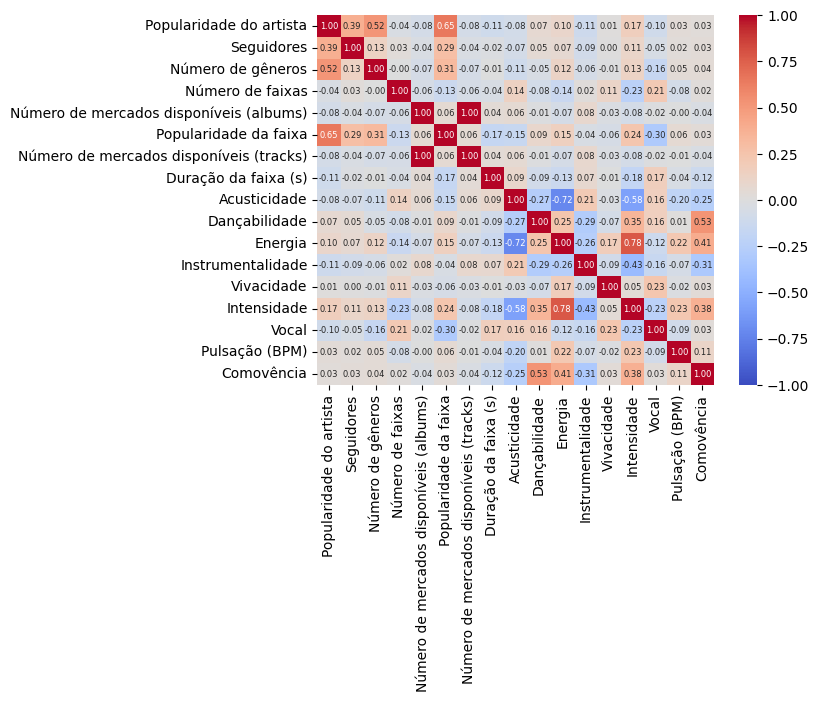

In [116]:
#Criação de data frame numérico para correlações
df_numerico = df_all_inners.drop(['Nome do artista', 'Gêneros', 'track_name_prev (artists)', 'ID do artista', 'ID da faixa_x', 'Nome do álbum', 'Tipo do álbum', 'Mercados disponíveis (albums)', 'href (albums)', 'uri (albums)', 'track_name_prev (albums)', 'ID do álbum', 'ID da faixa_y', 'Nome da faixa', 'Playlist', 'Número do disco', 'Mercados disponíveis (tracks)', 'ID do artista (tracks)', 'ID da faixa (tracks)', 'uri (tracks)', 'track_name_prev (tracks)', 'href (tracks)', 'Data de lançamento', 'País', 'Número da faixa', 'Tom', 'Ritmo', 'Modo'], axis = 1)


#Criação do heatmap
sns.heatmap(df_numerico.corr(),
            annot=True, fmt = '.2f', annot_kws={'size':6},
            vmin = -1,  vmax = 1,
            cmap = 'coolwarm')

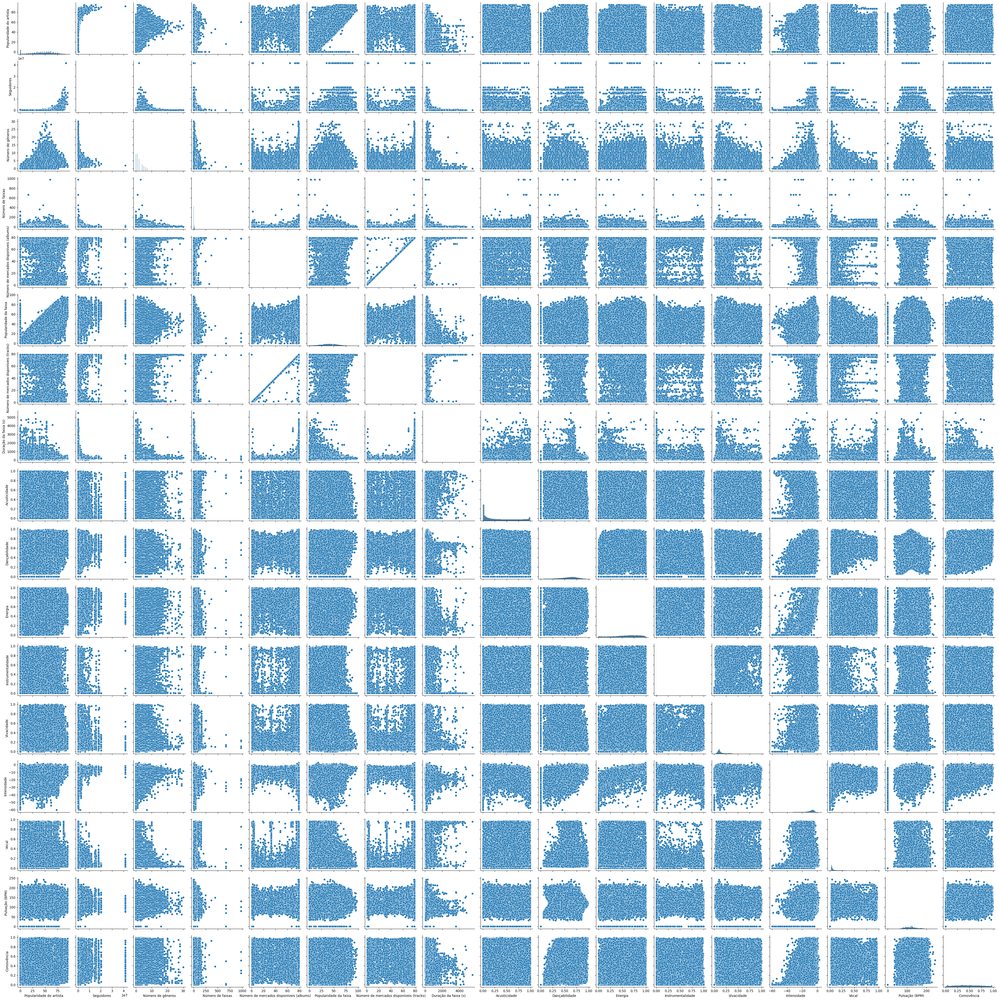

In [117]:
#Criação de pairplot
sns.pairplot(df_numerico)